<center>
  <h1 style="
      background: linear-gradient(45deg, #4CAF50, #2196F3);
      color: #ffffff;
      font-size: 36px;
      font-weight: bold;
      font-family: 'Arial', sans-serif;
      border: 2px solid #2196F3;
      padding: 10px;
      border-radius: 8px;
      text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5);
      margin: 20px 0;
  "> Sudoku</h1>
</center>


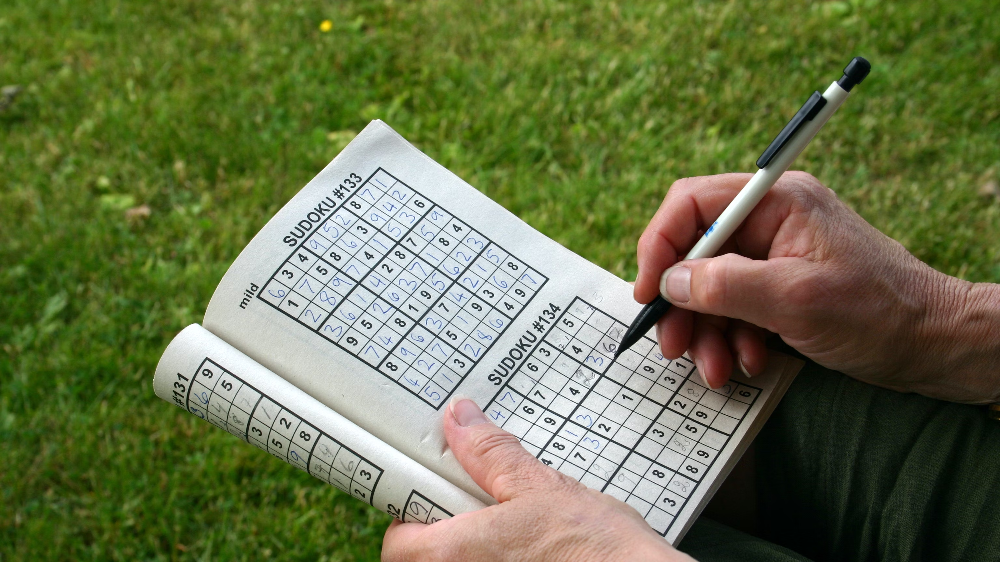

In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [35]:
def imread(img_path):
    img = cv2.imread(img_path)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def rgb2gray(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

def rgb2bin(img):
    img = rgb2gray(img)
    t, img_bin = cv2.threshold(img, 0, 255, cv2.THRESH_OTSU|cv2.THRESH_BINARY_INV)
    return img_bin

def imshow(img, figsize=(10, 10)):
    plt.figure(figsize=figsize)
    plt.imshow(img, cmap='gray')
    plt.show()
def imread_rgb(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    return img

In [36]:
def order_points(pts):
    rect = np.zeros((4, 2), dtype = "float32")
    s = pts.sum(axis = 1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]
    diff = np.diff(pts, axis = 1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]
    return rect

In [37]:
def four_point_transform(image, pts):
   
    pts = pts.reshape(4, 2)
    rect = order_points(pts)
    (tl, tr, br, bl) = rect
    
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))
    
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))
    
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype = "float32")
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
    return warped

<center>
  <h1 style="
      background: linear-gradient(45deg, #4CAF50, #2196F3);
      color: #ffffff;
      font-size: 36px;
      font-weight: bold;
      font-family: 'Arial', sans-serif;
      border: 2px solid #2196F3;
      padding: 10px;
      border-radius: 8px;
      text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5);
      margin: 20px 0;
  ">Reading Image</h1>
</center>

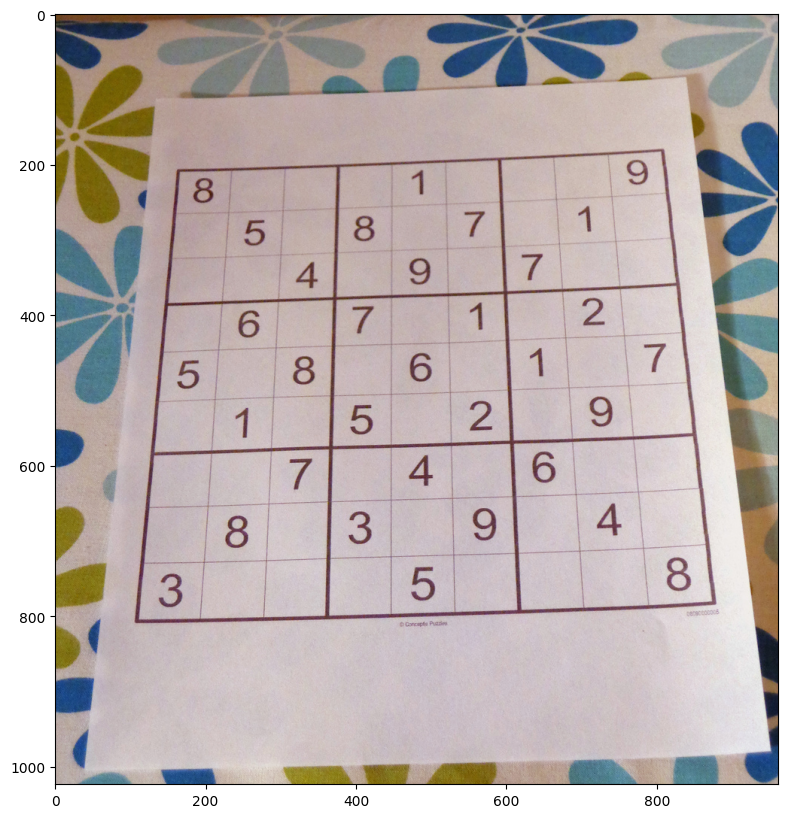

In [38]:
img = imread_rgb('/kaggle/input/sudoku/sudoku.jpg')
imshow(img)

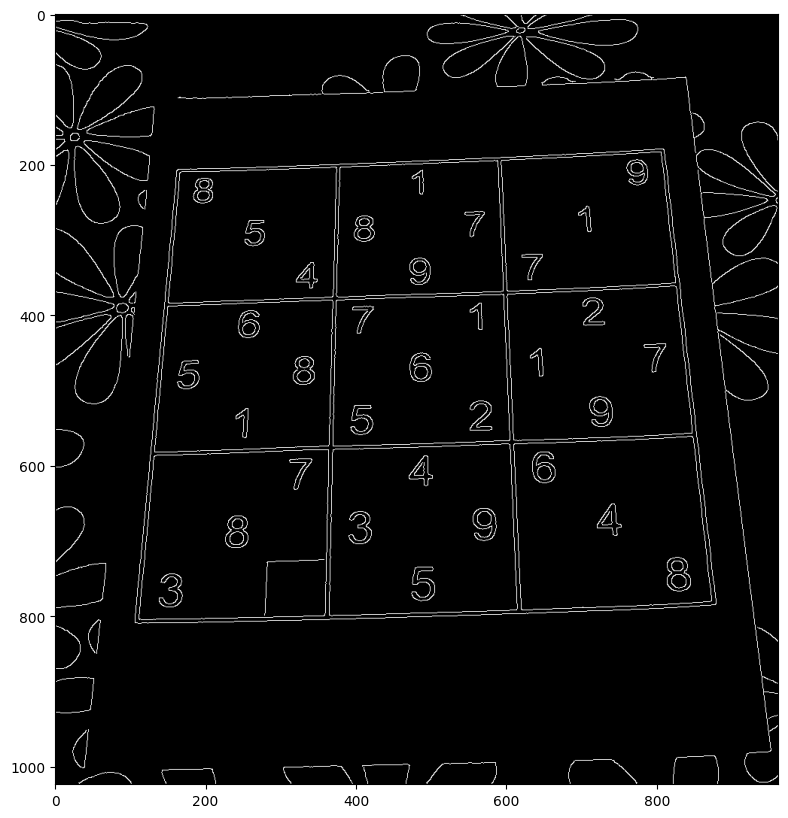

In [39]:
blur = cv2.GaussianBlur(img, (5, 5), 0)
edges = cv2.Canny(blur, 75, 200)
imshow(edges)

<center>
  <h1 style="
      background: linear-gradient(45deg, #4CAF50, #2196F3);
      color: #ffffff;
      font-size: 36px;
      font-weight: bold;
      font-family: 'Arial', sans-serif;
      border: 2px solid #2196F3;
      padding: 10px;
      border-radius: 8px;
      text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5);
      margin: 20px 0;
  ">finding Contours for Image</h1>
</center>

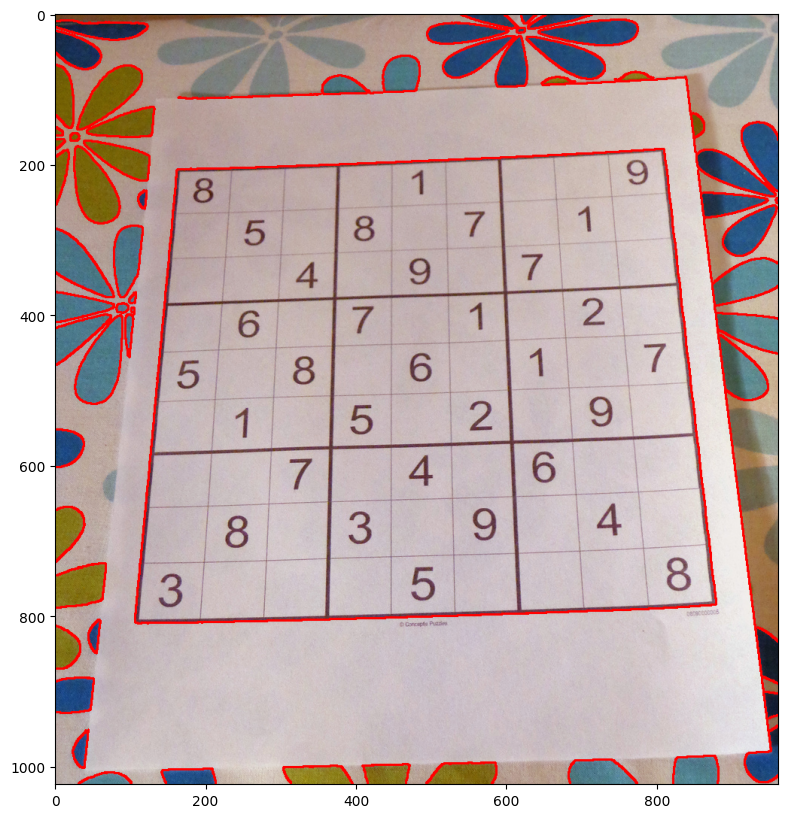

In [40]:
contours, rel = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

img_copy = img.copy()
cv2.drawContours(img_copy, contours, -1, (255, 0, 0), 2)
imshow(img_copy)

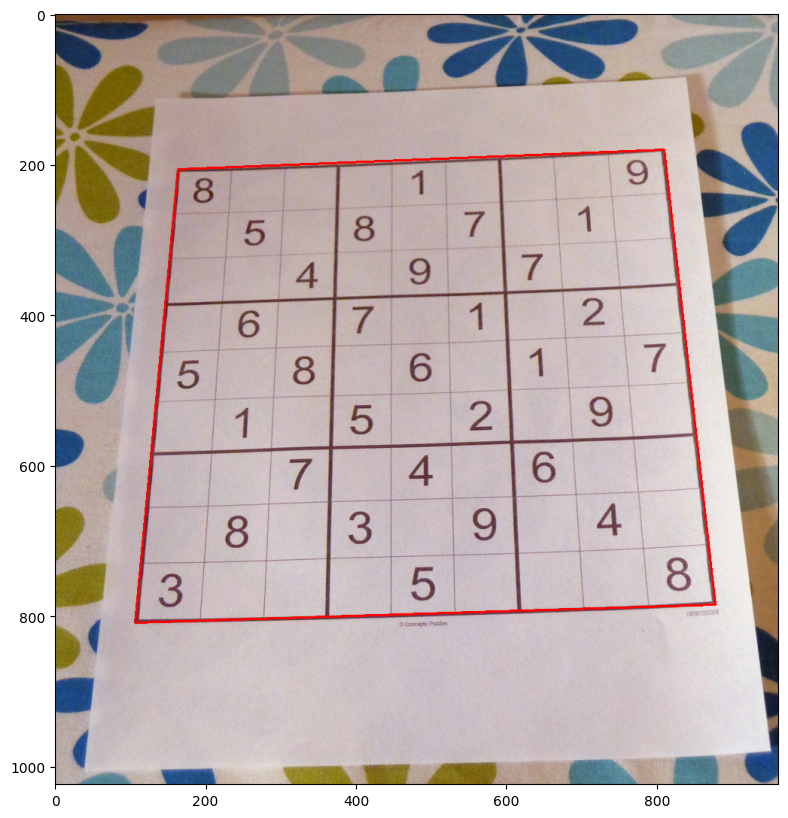

In [41]:
contours = sorted(contours, key=cv2.contourArea, reverse=True)

sheetContour = None
for c in contours:
    length = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.01 * length, True)
    if len(approx) == 4:
        sheetContour = approx
        break
        
img_copy = img.copy()
cv2.drawContours(img_copy, [sheetContour], 0, (255, 0, 0), 2)
imshow(img_copy)

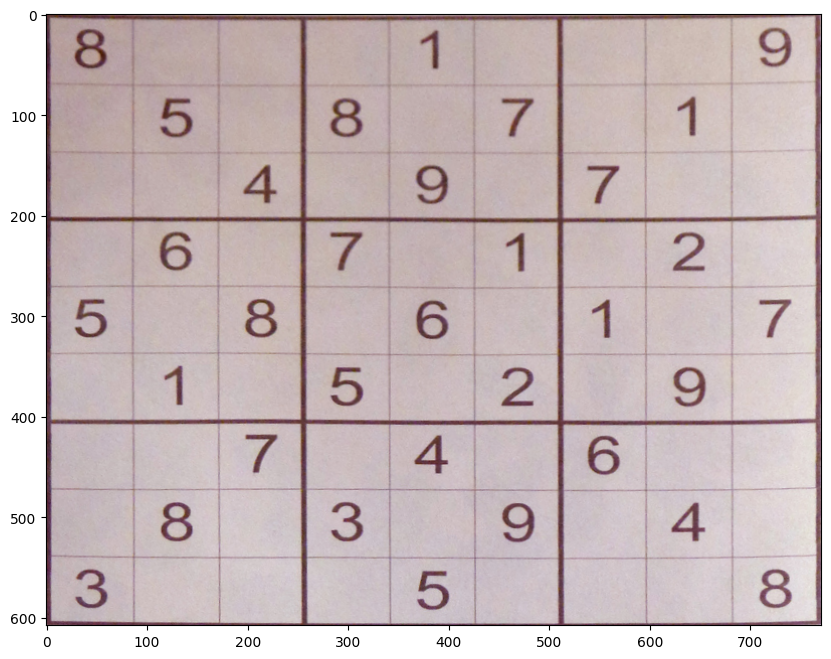

In [42]:
sheet = four_point_transform(img, sheetContour)
imshow(sheet)

<center>
  <h1 style="
      background: linear-gradient(45deg, #4CAF50, #2196F3);
      color: #ffffff;
      font-size: 36px;
      font-weight: bold;
      font-family: 'Arial', sans-serif;
      border: 2px solid #2196F3;
      padding: 10px;
      border-radius: 8px;
      text-shadow: 2px 2px 4px rgba(0, 0, 0, 0.5);
      margin: 20px 0;
  ">Detecting Connected Components In Sudoku Image</h1>
</center>


In [43]:
def detect_connected_components(
        img_rgb, 
        w_range=None, 
        h_range=None,
):
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    ret, img_bin = cv2.threshold(
        img_gray, 
        0, 
        255, 
        cv2.THRESH_OTSU|cv2.THRESH_BINARY_INV
    )

    components = cv2.connectedComponentsWithStats(
        img_bin, connectivity=4)
    (nLabels, labels, stats, centroids) = components
    centroids = centroids.astype(int)

    img = img_rgb.copy()

    for i in range(1, nLabels):
        x, y, w, h, area = stats[i]
        (cx, cy) = centroids[i]   

        acceptWidth = True
        acceptHeight = True
        
        if w_range:
            acceptWidth = (w > w_range[0] and w < w_range[1])
        if h_range:
            acceptHeight = (h > h_range[0] and h < h_range[1])
        
        if acceptWidth and acceptHeight:
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 255), 3)
            cv2.circle(img, (cx, cy), 4, (255, 255, 255), -1)

    imshow(img, figsize=(10, 10))

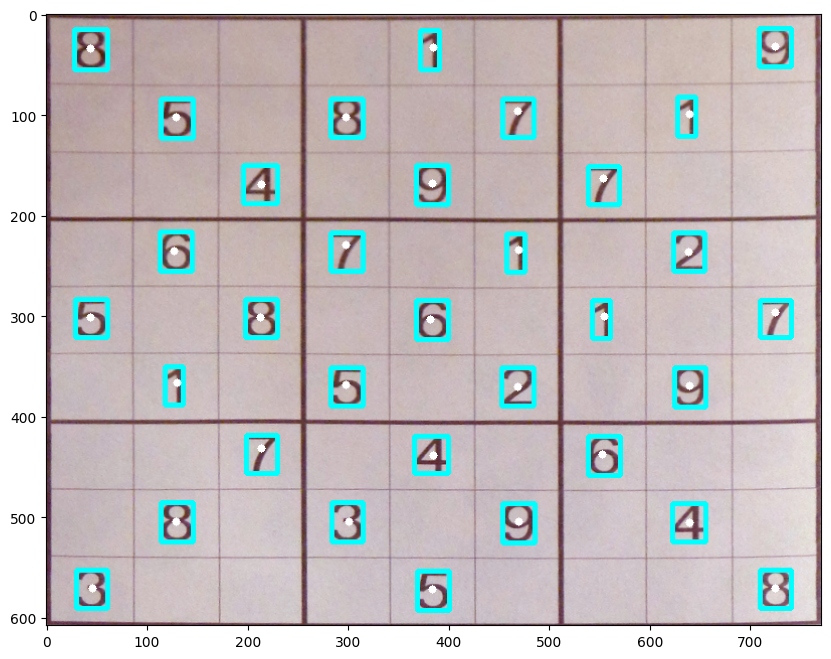

In [44]:
detect_connected_components(sheet, w_range=(15, 46), h_range=(20, 46))